<a href="https://colab.research.google.com/github/zaimahfira/Project/blob/main/AdvanceCNN_Video.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CNN Video - Zaimah Fira Azzahra



In [ ]:
#import library
import os
import cv2
import math
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt

from moviepy.editor import *
%matplotlib inline

from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

In [ ]:
#mengatur fungsi agar angka acak memiliki nilai sama
seed_constant = 27
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

In [ ]:
#download dataset
!wget --no-check-certificate https://www.crcv.ucf.edu/data/UCF50.rar

#extract dataset
!unrar x UCF50.rar

Streaming output truncated to the last 5000 lines.
Extracting  UCF50/HorseRace/v_HorseRace_g16_c03.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g16_c04.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g16_c05.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c01.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c02.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c03.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c04.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g17_c05.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g18_c01.avi                       23%  OK 
Extracting  UCF50/HorseRace/v_HorseRace_g18_c02.avi                       23%  OK 
Extracting  UCF50/HorseRace/v

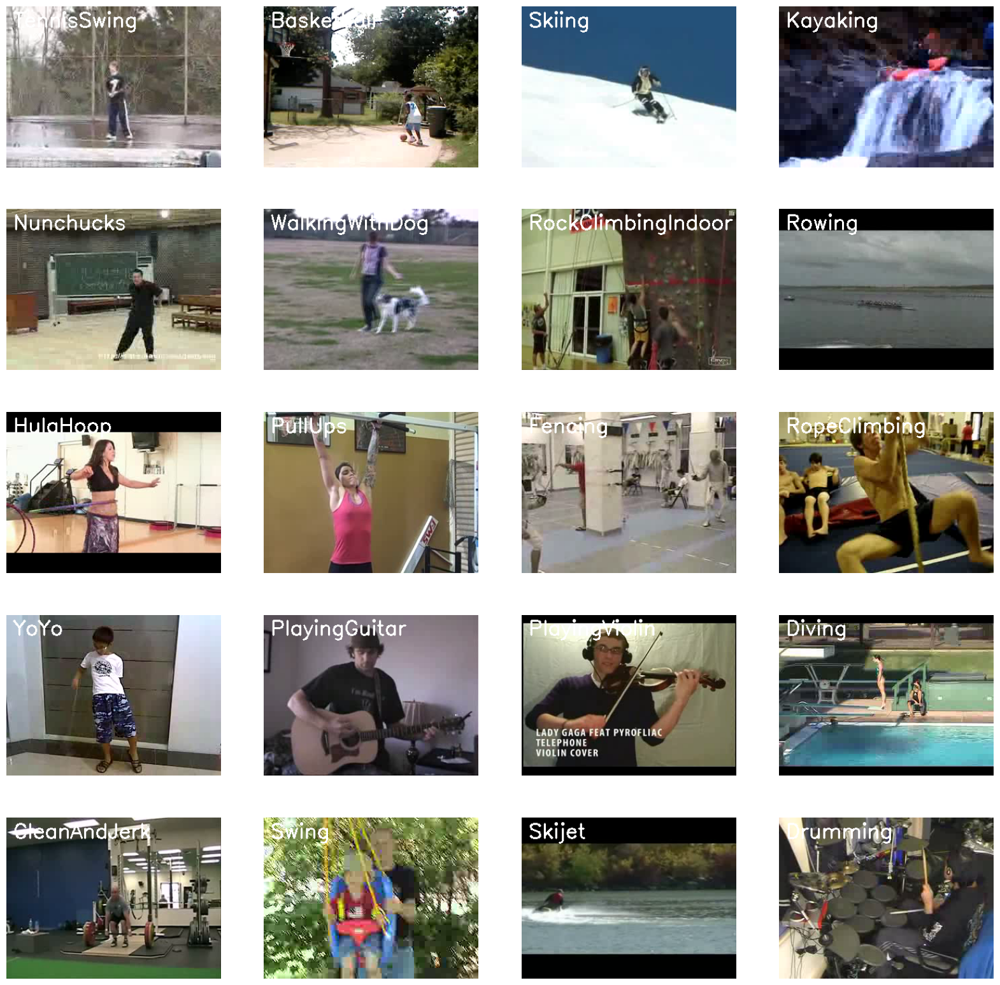

In [ ]:
#Visualisasi 20 kategori

# Membuat ukuran
plt.figure(figsize = (20,20))

# Nama kategori
all_classes_names = os.listdir('UCF50')

# Menampilkan 20 daftar nilai acak. Nilai berkisar antara 0-50, di mana 50 adalah jumlah total kelas dalam kumpulan data.
random_range = random.sample(range(len(all_classes_names)), 20)

#Iterasi melalui semua nilai acak yang ditampilkan.
for counter, random_index in enumerate(random_range, 1):
  #Ambil Nama Kelas menggunakan Indeks Acak
  selected_class_Name = all_classes_names[random_index]

  #Ambil semua daftar file video yang ada di Direktori Kelas yang dipilih secara acak.
  video_files_names_list = os.listdir(f'UCF50/{selected_class_Name}')

  #Pilih file video dari daftar yang diambil dari Direktori Kelas yang dipilih secara acak.
  selected_video_file_name = random.choice(video_files_names_list)

  #Inisialisasi objek videoCapture untuk dibaca dari File video.
  video_reader = cv2.VideoCapture(f'UCF50/{selected_class_Name}/{selected_video_file_name}')

  #Membaca background awal file video.
  _, bgr_frame = video_reader.read()

  #Menampilkan objek videocapture
  video_reader.release()

  #Konversi background dari BGR ke format RGB
  rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)

  #Tulis nama kelas pada background video
  cv2.putText(rgb_frame,selected_class_Name,(10,30),cv2.FONT_HERSHEY_SIMPLEX,1,(255,255,255),2)

  #Menampilkan background
  plt.subplot(5,4,counter);plt.imshow(rgb_frame);plt.axis('off')

###Preprocessing

In [ ]:
#Tentukan tinggi dan lebar setiap frame video yang akan diubah ukurannya di dataset.
IMAGE_HEIGHT, IMAGE_WIDTH= 64, 64


#Tentukan jumlah frame video yang akan diumpankan ke model sebagai satu urutan.
SEQUENCE_LENGTH = 20

#Tentukan direktori yang berisi kumpulan data UCFSe.

DATASET_DIR = "UCF50"


#Tentukan daftar yang berisi nama-nama kelas yang digunakan untuk data training.
CLASSES_LIST = ["Basketball", "TaiChi", "Diving", "HorseRace"]

######Membuat function untuk mengekstrak,resize,dan normalisasi frame

In [ ]:
def frames_extraction(video_path):
    '''
    Args:
        video_path: path/Jalur video pada disk yang framenya diekstrak.
    Returns:
        frames_list: list dari frame yang sudah di resize dan normalisasi.
    '''

    # Nyatakan list untuk menyimpan frame video.
    frames_list = []

    # Baca File Video menggunakan objek VideoCapture.
    video_reader = cv2.VideoCapture(video_path)

    # Dapatkan jumlah total frame dalam video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Hitung interval setelah frame mana yang akan ditambahkan ke daftar.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

    # Ulangi melalui frame Video.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Atur posisi frame video saat ini.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Membaca frame dari video.
        success, frame = video_reader.read()

        # Periksa apakah frame Video tidak berhasil dibaca lalu hentikan loop
        if not success:
            break

        # Ubah ukuran Frame ke tinggi dan lebar tetap.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalisasikan frame yang diubah ukurannya dengan membaginya dengan 255 sehingga setiap nilai piksel berada di antara 0 dan 1
        normalized_frame = resized_frame / 255

        # Tambahkan frame yang dinormalisasi ke dalam daftar frame
        frames_list.append(normalized_frame)

    # Release the VideoCapture object.
    video_reader.release()

    # Kembalikan daftar frame.
    return frames_list

######Membuat Function untuk membuat dataset

In [ ]:
def create_dataset():
    '''
    Fungsi ini akan mengekstrak data dari kelas yang dipilih dan membuat kumpulan data yang diperlukan.
    Returns:
        features:          list yang berisi frame videos yang telah diektrak.
        labels:            list yang berisi indeks kelas yang terkait dengan video.
        video_files_paths: list yang berisi jalur video di disk.
    '''

    # Mendeklarasikan Daftar Kosong untuk menyimpan fitur, label, dan nilai jalur file video.
    features = []
    labels = []
    video_files_paths = []

    # Iterasi melalui semua kelas yang disebutkan dalam daftar kelas
    for class_index, class_name in enumerate(CLASSES_LIST):

        # Tampilkan nama kelas yang datanya sedang diekstraksi.
        print(f'Extracting Data of Class: {class_name}')

        # Dapatkan daftar file video yang ada dalam nama kelas tertentu directory.
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))

        # Ulangi semua file yang ada dalam daftar file.
        for file_name in files_list:

            # Dapatkan video lengkap.
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)

            # Ekstrak frame file video.
            frames = frames_extraction(video_file_path)

            # Periksa apakah frame yang diekstraksi sama dengan SEQUENCE_LENGTH yang ditentukan di atas.
            # Jadi abaikan video yang memiliki frame kurang dari SEQUENCE_LENGTH.
            if len(frames) == SEQUENCE_LENGTH:

               # Tambahkan data ke daftar masing-masing.
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)

    # Mengubah daftar menjadi array numpy
    features = np.asarray(features)
    labels = np.array(labels)

   # Kembalikan frame, indeks kelas, dan jalur file video.
    return features, labels, video_files_paths

In [ ]:
#Membuat dataset
features, labels, video_files_paths = create_dataset()

Extracting Data of Class: Basketball
Extracting Data of Class: TaiChi
Extracting Data of Class: Diving
Extracting Data of Class: HorseRace


In [ ]:
#Menggunkan keras untuk konversi label kategori ke dalam vektor one_hot_encoded
one_hot_encoded_labels = to_categorical(labels)

####Split Data

In [ ]:
#Split data dengan data training dan testing (75:25)
features_train,features_test,labels_train,labels_test = train_test_split(features,one_hot_encoded_labels,
                                                                         test_size = 0.25,shuffle = True,
                                                                         random_state = seed_constant)

####Pengaplikasian Model

In [ ]:
def create_convlstm_model():


    # menggunakan model Sequential untuk konstruksi model
    model = Sequential()

    # Menentukan Model Arsitektur.
    ########################################################################################################################

    model.add(ConvLSTM2D(filters = 4, kernel_size = (3, 3), activation = 'tanh',data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True, input_shape = (SEQUENCE_LENGTH,
                                                                                      IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters = 8, kernel_size = (3, 3), activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True))

    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters = 14, kernel_size = (3, 3), activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True))

    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters = 16, kernel_size = (3, 3), activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True))

    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(Flatten())

    model.add(Dense(len(CLASSES_LIST), activation = "softmax"))

    ########################################################################################################################

    # Tampilkan ringkasan model.
    model.summary()

    # Mengembalikan model konvusional lstm yang dibangun.
    return model

In [ ]:
#Menampilkan konstruksi model
convlstm_model = create_convlstm_model()
print("Model selesai dibuat")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, 20, 62, 62, 4)     1024      
                                                                 
 max_pooling3d (MaxPooling3D  (None, 20, 31, 31, 4)    0         
 )                                                               
                                                                 
 time_distributed (TimeDistr  (None, 20, 31, 31, 4)    0         
 ibuted)                                                         
                                                                 
 conv_lstm2d_1 (ConvLSTM2D)  (None, 20, 29, 29, 8)     3488      
                                                                 
 max_pooling3d_1 (MaxPooling  (None, 20, 15, 15, 8)    0         
 3D)                                                             
                                                        

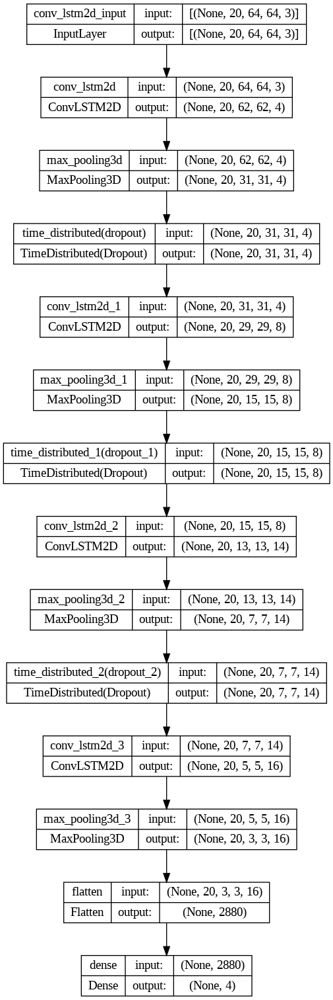

In [ ]:
#menampilkan struktur model
plot_model(convlstm_model, to_file = 'convlstm_model_structure_plot.png', show_shapes = True, show_layer_names = True)

In [ ]:
# Buat Instance Callback EarlyStopping untuk memantau metrik dan menghentikan pelatihan saat tidak ada perbaikan yang terlihat.
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 10, mode = 'min', restore_best_weights = True)

# Kompilasi model dan tentukan nilai fungsi loss, pengoptimal, dan metrik ke model
convlstm_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

# Mulai melatih model.
convlstm_model_training_history = convlstm_model.fit(x = features_train, y = labels_train, epochs = 50, batch_size = 4,
                                                     shuffle = True, validation_split = 0.2,
                                                     callbacks = [early_stopping_callback])

Epoch 1/50
78/78 [==============================] - 198s 2s/step - loss: 1.2339 - accuracy: 0.4401 - val_loss: 0.9774 - val_accuracy: 0.6538
Epoch 2/50
78/78 [==============================] - 187s 2s/step - loss: 0.9264 - accuracy: 0.6246 - val_loss: 0.8107 - val_accuracy: 0.7051
Epoch 3/50
78/78 [==============================] - 186s 2s/step - loss: 0.7777 - accuracy: 0.7217 - val_loss: 0.7537 - val_accuracy: 0.7051
Epoch 4/50
78/78 [==============================] - 191s 2s/step - loss: 0.6486 - accuracy: 0.7832 - val_loss: 0.7473 - val_accuracy: 0.7308
Epoch 5/50
78/78 [==============================] - 188s 2s/step - loss: 0.4921 - accuracy: 0.8188 - val_loss: 0.4648 - val_accuracy: 0.8205
Epoch 6/50
78/78 [==============================] - 188s 2s/step - loss: 0.3932 - accuracy: 0.8803 - val_loss: 0.5036 - val_accuracy: 0.7949
Epoch 7/50
78/78 [==============================] - 189s 2s/step - loss: 0.3343 - accuracy: 0.8576 - val_loss: 0.6758 - val_accuracy: 0.7436
Epoch 8/50
78

In [ ]:
#Evaluasi Model
model_evaluation_history = convlstm_model.evaluate(features_test, labels_test)

5/5 [==============================] - 18s 3s/step - loss: 0.1110 - accuracy: 0.9538


In [ ]:
# Menampilkan loss dan akurasi dari model_evaluation_history.
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history

# Tentukan format tanggal string.
date_time_format = '%Y_%m_%d__%H_%M_%S'
# Dapatkan Tanggal dan Waktu saat ini di Objek DateTime.
current_date_time_dt = dt.datetime.now()
# Ubah objek DateTime menjadi string sesuai dengan gaya yang disebutkan dalam string date_time_format.
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)

#Tetapkan nama model untuk memudahkan saat menavigasi melalui beberapa model yang disimpan.
model_file_name = f'convlstm_model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'

# Menyimpan Model.
convlstm_model.save(model_file_name)

In [ ]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    '''
    This function will plot the metrics passed to it in a graph.
    Args:
        model_training_history: histori berisi catatan pelatihan dan validasi
                                nilai loss dan metrik pada epochs berturut-turut
        metric_name_1:          Nama metrik pertama yang perlu diplot dalam grafik.
        metric_name_2:          Nama metrik kedua yang perlu diplot dalam grafik.
        plot_name:              Judul grafik.
    '''

    # Dapatkan nilai metrik menggunakan nama metrik sebagai pengidentifikasi.
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]

    # Membangun rentang objek yang akan digunakan sebagai sumbu x (bidang horizontal) dari grafik.
    epochs = range(len(metric_value_1))

    # Plot Grafiknya disertai warna berbeda.
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)

    # Tambahkan judul ke plot.
    plt.title(str(plot_name))

    # Tambahkan legend ke plot.
    plt.legend()

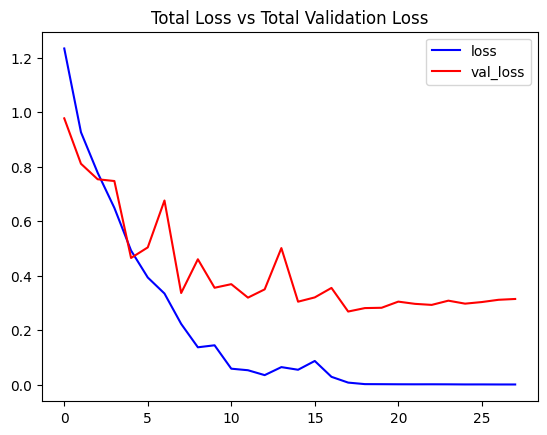

In [ ]:
# Visualisasi data training dan loss
plot_metric(convlstm_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

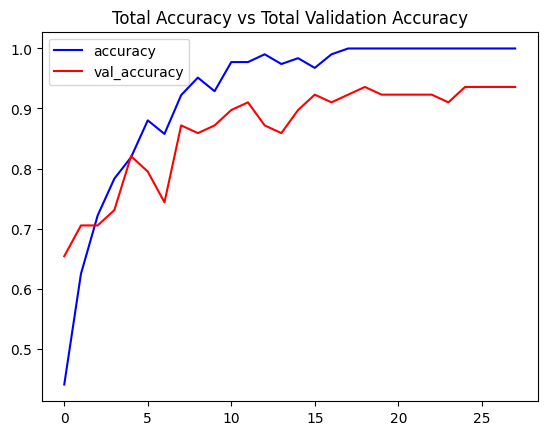

In [ ]:
# Visualisasi data training dan accuracy.
plot_metric(convlstm_model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

Untuk perbandingan metrik loss dan akurasi dengan model ini cukup baik hasil akan lebih akurat jika jarak data training dan loss serta data training dan akurasi lebih dekat

In [ ]:
def create_LRCN_model():
    '''
    Fungsi ini membangun model LRCN yaitu gabungan dari model CNN dan RNN.
    Returns:
        model: Ini adalah model LRCN yang diperlukan.
    '''

    # Menggunakan model Sequential untuk konstruksi model.
    model = Sequential()

    # Menentukan Arsitektur Model.
    ########################################################################################################################

    model.add(TimeDistributed(Conv2D(16, (3, 3), padding='same',activation = 'relu'),
                              input_shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(32, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Flatten()))

    model.add(LSTM(32))

    model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))

    ########################################################################################################################

    # Tampilkan ringkasan model.
    model.summary()

    # Kembalikan model LRCN yang dibangun.
    return model

In [ ]:
# Bangun model LRCN yang diperlukan.
LRCN_model = create_LRCN_model()
print("Model Selesai dibuat")

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_3 (TimeDis  (None, 20, 64, 64, 16)   448       
 tributed)                                                       
                                                                 
 time_distributed_4 (TimeDis  (None, 20, 16, 16, 16)   0         
 tributed)                                                       
                                                                 
 time_distributed_5 (TimeDis  (None, 20, 16, 16, 16)   0         
 tributed)                                                       
                                                                 
 time_distributed_6 (TimeDis  (None, 20, 16, 16, 32)   4640      
 tributed)                                                       
                                                                 
 time_distributed_7 (TimeDis  (None, 20, 4, 4, 32)    

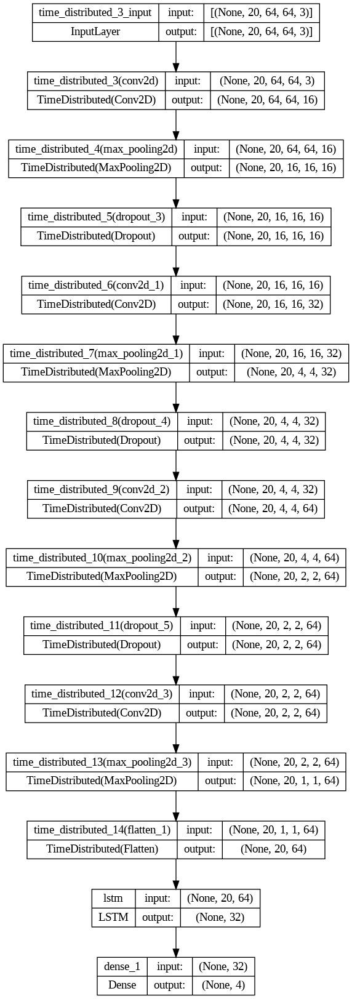

In [ ]:
# Plot struktur model LRCN yang telah dibuat.
plot_model(LRCN_model, to_file = 'LRCN_model_structure_plot.png', show_shapes = True, show_layer_names = True)

In [ ]:
# Buat Instance Callback Penghentian Awal.
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = 'min', restore_best_weights = True)

# Kompilasi model dan tentukan fungsi kerugian, pengoptimal, dan metrik ke model.
LRCN_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

# Mulai melatih model.
LRCN_model_training_history = LRCN_model.fit(x = features_train, y = labels_train, epochs = 70, batch_size = 4 ,
                                             shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback])

Epoch 1/70
78/78 [==============================] - 27s 292ms/step - loss: 1.3854 - accuracy: 0.2913 - val_loss: 1.3592 - val_accuracy: 0.2564
Epoch 2/70
78/78 [==============================] - 20s 255ms/step - loss: 1.2921 - accuracy: 0.3883 - val_loss: 1.0389 - val_accuracy: 0.5641
Epoch 3/70
78/78 [==============================] - 18s 235ms/step - loss: 0.8824 - accuracy: 0.6634 - val_loss: 0.8458 - val_accuracy: 0.6538
Epoch 4/70
78/78 [==============================] - 20s 260ms/step - loss: 0.7647 - accuracy: 0.6893 - val_loss: 0.7705 - val_accuracy: 0.6667
Epoch 5/70
78/78 [==============================] - 23s 294ms/step - loss: 0.6412 - accuracy: 0.7573 - val_loss: 0.6884 - val_accuracy: 0.7308
Epoch 6/70
78/78 [==============================] - 22s 277ms/step - loss: 0.4753 - accuracy: 0.8350 - val_loss: 0.6489 - val_accuracy: 0.6923
Epoch 7/70
78/78 [==============================] - 18s 234ms/step - loss: 0.4654 - accuracy: 0.8058 - val_loss: 1.0110 - val_accuracy: 0.6026

In [ ]:
# Evaluasi model.
model_evaluation_history = LRCN_model.evaluate(features_test, labels_test)

5/5 [==============================] - 3s 538ms/step - loss: 0.0782 - accuracy: 0.9846


In [ ]:
# Dapatkan loss dan akurasi dari model_evaluation_history.
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history

# Tentukan format tanggal string.
# Dapatkan Tanggal dan Waktu saat ini di Objek DateTime.
# Ubah objek DateTime menjadi string sesuai dengan gaya yang disebutkan dalam string date_time_format.
date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)

# Tetapkan nama yang berguna untuk model kami untuk memudahkan kami saat menavigasi melalui beberapa model yang disimpan.
model_file_name = f'LRCN_model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'

# Save the Model.
LRCN_model.save(model_file_name)

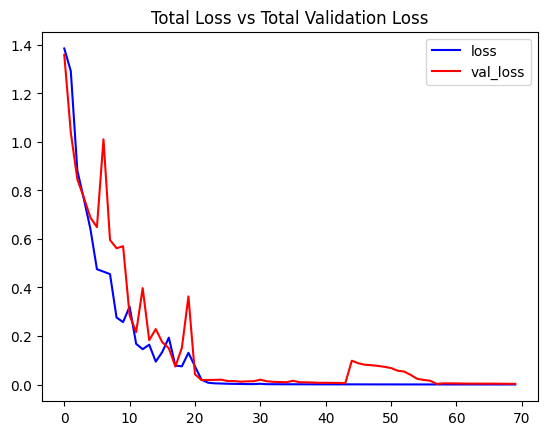

In [ ]:
# Visualisasikan metrik kerugian pelatihan dan validasi.
plot_metric(LRCN_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

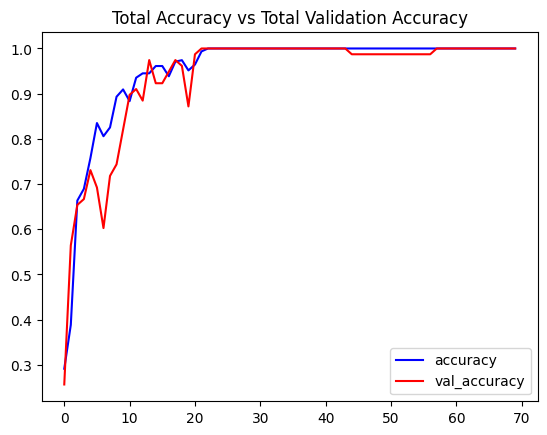

In [ ]:
# Visualisasikan metrik akurasi pelatihan dan validasi.
plot_metric(LRCN_model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

Untuk perbandingan metrik loss dan akurasi dengan model ini cukup baik tidak terlalu overfitting

####Prediksi

######Membuat function untuk recognition video yang memprediksi banyak kegiatan pada satu video

In [ ]:
def predict_on_video(video_file_path, output_file_path, SEQUENCE_LENGTH):
    '''
    Fungsi ini akan melakukan pengenalan(recognition) kegiatan pada video menggunakan model LRCN.
    Args:
    video_file_path:  Jalur video yang disimpan dalam disk tempat pengenalan kegiatan yang dilakukan.
    output_file_path: Jalur tempat keluaran video dengan kegiatan yang diprediksi dilakukan overlay akan disimpan.
    SEQUENCE_LENGTH:  Jumlah frame video tetap yang dapat diteruskan ke model sebagai satu urutan.
    '''

    # Inisialisasi VideoCapture untuk membaca dari file video.
    video_reader = cv2.VideoCapture(video_file_path)

    # Dapatkan lebar dan tinggi video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Inisialisasi VideoWriter untuk menyimpan video keluaran dalam disk.
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'),
                                   video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))

    # Nyatakan antrean untuk menyimpan frame video.
    frames_queue = deque(maxlen = SEQUENCE_LENGTH)

    # Menginisialisasi variabel untuk menyimpan tindakan yang diperkirakan sedang dilakukan dalam video.
    predicted_class_name = ''

    # Ulangi hingga video berhasil diakses.
    while video_reader.isOpened():

        # Membaca frame.
        ok, frame = video_reader.read()

        # Periksa apakah frame tidak terbaca dengan benar lalu hentikan loop.
        if not ok:
            break

        # Ubah ukuran Frame ke Dimensi tetap.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalisasikan frame yang diubah ukurannya dengan membaginya dengan 255 sehingga setiap nilai piksel berada di antara 0 dan 1.
        normalized_frame = resized_frame / 255

        # Menambahkan frame yang telah diproses sebelumnya ke dalam daftar frame.
        frames_queue.append(normalized_frame)

        # Periksa apakah jumlah frame dalam antrian sama dengan panjang urutan tetap.
        if len(frames_queue) == SEQUENCE_LENGTH:

            # Berikan frame yang dinormalisasi ke model dan dapatkan probabilitas yang diprediksi.
            predicted_labels_probabilities = LRCN_model.predict(np.expand_dims(frames_queue, axis = 0))[0]

            # Dapatkan indeks kelas dengan probabilitas tertinggi.
            predicted_label = np.argmax(predicted_labels_probabilities)

            # Dapatkan nama kelas menggunakan indeks yang diambil.
            predicted_class_name = CLASSES_LIST[predicted_label]

        # Tulis nama kelas yang diprediksi di atas frame.
        cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

        # Tulis Frame ke dalam disk menggunakan Objek VideoWriter.
        video_writer.write(frame)

    # Lepaskan objek VideoCapture dan VideoWriter.
    video_reader.release()
    video_writer.release()

In [ ]:
#Masukkan nama video
input_video_file_path = f'video.mp4'

# Bangun jalur keluaran video.
output_video_file_path = f'video{SEQUENCE_LENGTH}.mp4'

# Lakukan prediksi recognition video.
predict_on_video(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Tampilkan keluaran video yang telah diprediksi.
VideoFileClip(output_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()

1/1 [==============================] - 0s 38ms/step
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


####Prediksi untuk satu kegiatan dalam satu video

In [ ]:
def predict_single_action(video_file_path, SEQUENCE_LENGTH):
    '''
   Fungsi ini akan melakukan prediksi recognition video hanya satu kegiatan menggunakan model LRCN.
    Args:
    video_file_path:  Jalur video yang disimpan dalam disk tempat pengenalan kegiatan yang dilakukan.
    SEQUENCE_LENGTH:  Jumlah frame video tetap yang dapat diteruskan ke model sebagai satu urutan.
    '''

    # Inisialisasi objek VideoCapture untuk membaca dari file video.
    video_reader = cv2.VideoCapture(video_file_path)

    # Dapatkan lebar dan tinggi video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Deklarasikan daftar untuk menyimpan frame video yang akan kita ekstrak.
    frames_list = []

    # Menginisialisasi variabel untuk menyimpan tindakan yang diperkirakan sedang dilakukan dalam video.
    predicted_class_name = ''

    # Dapatkan jumlah frame dalam video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Hitung interval setelah frame mana yang akan ditambahkan ke daftar.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)

    # Iterasi jumlah kali sama dengan panjang tetap urutan.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Atur posisi frame video saat ini.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Membaca frame.
        success, frame = video_reader.read()

        # Periksa jika frame tidak terbaca dengan benar lalu hentikan loop.
        if not success:
            break

        # Ubah ukuran Frame ke Dimensi tetap.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalisasikan frame yang diubah ukurannya dengan membaginya dengan 255 sehingga setiap nilai piksel berada di antara 0 dan 1.
        normalized_frame = resized_frame / 255

        # Menambahkan frame yang telah diproses sebelumnya ke dalam daftar frame
        frames_list.append(normalized_frame)

    # Meneruskan frame yang telah diproses sebelumnya ke model dan mendapatkan probabilitas yang diprediksi.
    predicted_labels_probabilities = LRCN_model.predict(np.expand_dims(frames_list, axis = 0))[0]

    # Dapatkan indeks kelas dengan probabilitas tertinggi.
    predicted_label = np.argmax(predicted_labels_probabilities)

    # Dapatkan nama kelas menggunakan indeks yang diambil.
    predicted_class_name = CLASSES_LIST[predicted_label]

    # Menampilkan kegiatan yang diprediksi bersama dengan keyakinan prediksi.
    print(f'Action Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')

    # Lepaskan VideoCapture.
    video_reader.release()

In [ ]:
# Masukan nama video yang telah disimpan
input_video_file_path = f'vid.mp4'

# Lakukan Prediksi satu jenis kegiatan pada video.
predict_single_action(input_video_file_path, SEQUENCE_LENGTH)

# Menampilkan hasil video.
VideoFileClip(input_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()

1/1 [==============================] - 0s 39ms/step
Action Predicted: Diving
Confidence: 0.9999202489852905
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



t:  99%|█████████▉| 1113/1122 [00:05<00:00, 202.73it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file vid.mp4, 151200 bytes wanted but 0 bytes read,at frame 1119/1122, at time 37.34/37.41 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+

  warnings.warn("Warning: in file %s, "%(self.filename)+

  warnings.warn("Warning: in file %s, "%(self.filename)+

                                                                 

Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [ ]:
# Masukan nama video yang telah disimpan
input_video_file_path = f'TaiChi.mp4'

# Lakukan Prediksi satu jenis kegiatan pada video.
predict_single_action(input_video_file_path, SEQUENCE_LENGTH)

# Menampilkan hasil video.
VideoFileClip(input_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()

1/1 [==============================] - 0s 44ms/step
Action Predicted: TaiChi
Confidence: 0.9998915195465088
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


Hasil prediksi untuk satu kegiatan lebih tepat dibandingkan banyak kegiatan karena nilai akurasi pada model ini belum mencapai 100%